![](https://miro.medium.com/max/1016/1*eEZAigUW7zDCK_1DLnmBdw.jpeg)

# Install some needed packages

In [1]:
## plotly for 3D visulization
!conda install -c plotly -y plotly
## yellowbrick for elbow method
#!conda install -c districtdatalabs -y yellowbrick
!pip install -U yellowbrick
#!conda install -c conda-forge -y kneed

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.8.2
  latest version: 4.8.3

Please update conda by running

    $ conda update -n base conda



# All requested packages already installed.

Requirement already up-to-date: yellowbrick in /opt/conda/lib/python3.7/site-packages (1.1)


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn import metrics
from sklearn.neighbors.nearest_centroid import NearestCentroid
import scipy.cluster.hierarchy as shc
from sklearn.utils import shuffle
import plotly.express as px
from sklearn.manifold import TSNE
from yellowbrick.cluster import KElbowVisualizer



from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings('ignore')
sns.set()

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.nearest_centroid module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


# 1. Load your dataset

In [3]:
data=pd.read_csv('CC GENERAL.csv')
data

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

### Dealing wit NaN values

In [5]:
data.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [6]:
data.CREDIT_LIMIT=data.CREDIT_LIMIT.fillna(data.CREDIT_LIMIT.mean())

In [7]:
std=data.MINIMUM_PAYMENTS.std()
mean=data.MINIMUM_PAYMENTS.mean()
is_null=data.MINIMUM_PAYMENTS.isnull().sum()

rand_min_pay=np.random.randint(mean - std, mean + std, size = is_null)
data.MINIMUM_PAYMENTS[data.MINIMUM_PAYMENTS.isnull()]=rand_min_pay

In [8]:
data.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

### Dealing with outliers

In [9]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,869.283900,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.612411,2895.063757,2346.037327,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,-1486.000000,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,168.553283,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,318.194598,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,864.062955,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [10]:
def simple_multiplot(data,ncols,plottype):
       
    nrows=int(data.shape[1]/ncols)+1
    cols=data.columns
    fig, axs = plt.subplots(nrows, ncols, constrained_layout=False)
    fig.set_figheight(ncols*20)
    fig.set_figwidth(15)
    
    for f in range(data.shape[1]):
        plt.subplot(nrows,ncols,f+1)
        plottype(data[cols[f]])
        plt.title(cols[f])
        
    plt.tight_layout()
    plt.show()

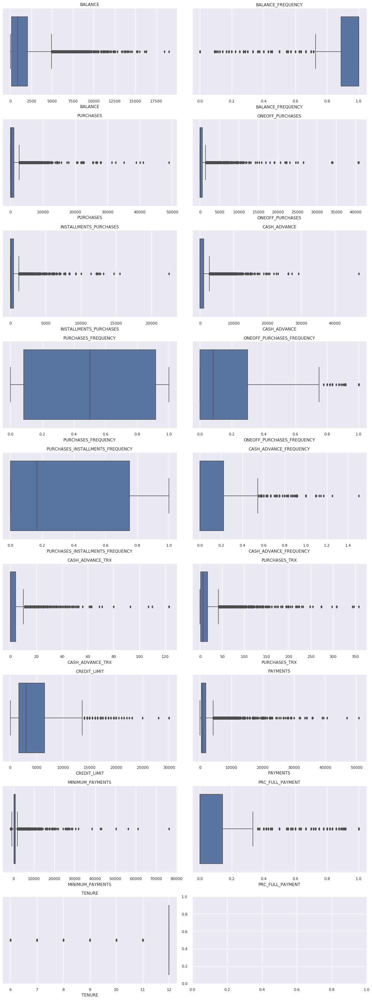

In [11]:
num_feats=data.drop(["CUST_ID"], axis=1).columns
simple_multiplot(data[num_feats],2,sns.boxplot)

In [12]:
scaler=StandardScaler()
scaler.fit(data[num_feats])
data2=scaler.transform(data[num_feats])
data2=pd.DataFrame(data2,columns=num_feats)

# 2. Use hierarchical clustering to identify the inherent groupings within your data.

## Calculating best 'n_clusters' parameter 

### Fitting K (number of clusters) using the Elbow method and the Distortion metric 

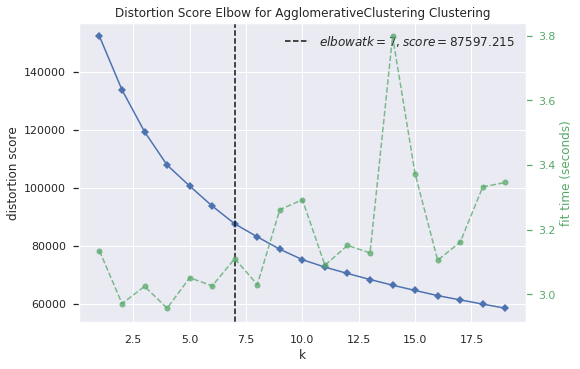

In [13]:
model = AgglomerativeClustering(affinity= "euclidean",linkage= 'ward')
visualizer_agg = KElbowVisualizer(model, k=(1,20),metric='distortion')

visualizer_agg.fit(data2)        
visualizer_agg.show()  

In [14]:
Agglo_n_clust_distortion=int(visualizer_agg.elbow_value_)
Agglo_dist=int(visualizer_agg.elbow_score_)
print(f"Elbow detected at K= {Agglo_n_clust_distortion} clusters with distortion {Agglo_dist}")

Elbow detected at K= 7 clusters with distortion 87597


In [15]:
modelf = AgglomerativeClustering(n_clusters=Agglo_n_clust_distortion,
                             affinity= "euclidean",
                             linkage= 'ward')

cluster_labels=modelf.fit_predict(data2)
aggro=pd.DataFrame(cluster_labels)
aggro.columns=['classe']
aggro

,classe
0,1
1,2
2,1
3,0
4,0
...,...
8945,5
8946,5
8947,5
8948,5


**Estimating Centroids**

In [40]:
clf = NearestCentroid()
clf.fit(data, cluster_labels)
agglo_centroids=pd.DataFrame(clf.centroids_,columns=num_feats)
agglo_centroids

ValueError: could not convert string to float: 'C10001'

# 3. Plot the clusters

## 2D plot

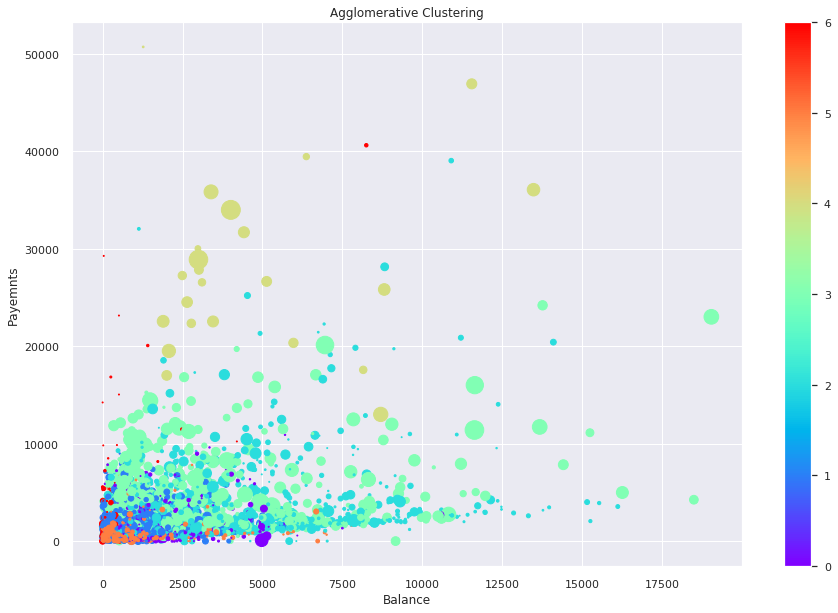

In [17]:
fig= plt.figure(figsize=(15,10))
ax=fig.add_subplot(111)
scatter = ax.scatter(data.BALANCE,data.PAYMENTS,c=cluster_labels,cmap='rainbow',alpha=1,s=data.PURCHASES_TRX)
ax.set_title('Agglomerative Clustering')
ax.set_xlabel('Balance')
ax.set_ylabel('Payemnts')
#ax.scatter(agglo_centroids.BALANCE,agglo_centroids.PAYMENTS, color='black',s=200,marker='x')
plt.colorbar(scatter)

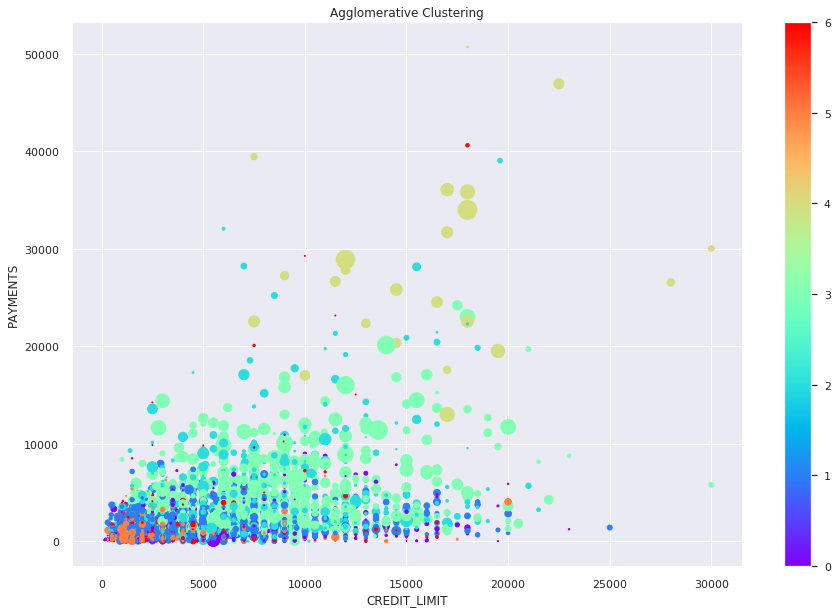

In [18]:
fig= plt.figure(figsize=(15,10))
ax=fig.add_subplot(111)
scatter = ax.scatter(data.CREDIT_LIMIT,data.PAYMENTS,c=cluster_labels,cmap='rainbow',alpha=1,s=data.PURCHASES_TRX)
ax.set_title('Agglomerative Clustering')
ax.set_xlabel('CREDIT_LIMIT')
ax.set_ylabel('PAYMENTS')
#ax.scatter(agglo_centroids.CREDIT_LIMIT,agglo_centroids.PAYMENTS, color='black',s=200,marker='x')
plt.colorbar(scatter)

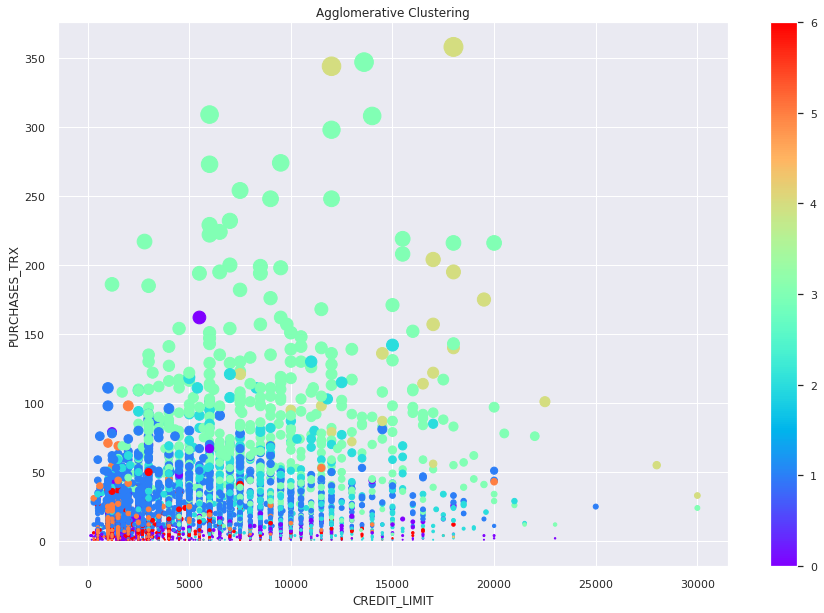

In [19]:
fig= plt.figure(figsize=(15,10))
ax=fig.add_subplot(111)
scatter = ax.scatter(data.CREDIT_LIMIT,data.PURCHASES_TRX,c=cluster_labels,cmap='rainbow',alpha=1,s=data.PURCHASES_TRX)
ax.set_title('Agglomerative Clustering')
ax.set_xlabel('CREDIT_LIMIT')
ax.set_ylabel('PURCHASES_TRX')
#ax.scatter(agglo_centroids.CREDIT_LIMIT,agglo_centroids.PURCHASES_TRX, color='black',s=200,marker='x')
plt.colorbar(scatter)

In [20]:
grpdata=data[num_feats].join(aggro).groupby('classe').mean()
grpdata

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
classe,,,,,,,,,,,,,,,,,
0,1578.160397,0.967514,270.756907,224.010508,46.952550,729.478261,0.142732,0.092128,0.053403,0.164079,3.368646,2.881674,3749.622668,1070.974268,1270.359166,0.021564,11.942760
1,733.877485,0.975130,1099.154665,525.789553,573.552715,118.964450,0.836854,0.288947,0.656582,0.027619,0.528489,20.008031,3896.457500,1200.294939,458.057083,0.252866,11.960612
2,4651.431746,0.982903,910.392608,531.743808,378.704222,4117.661375,0.458253,0.209703,0.329648,0.412502,12.444536,14.996689,7688.410596,3544.573881,1744.245836,0.038421,11.792219
3,2891.301067,0.979741,5393.286143,3349.819561,2044.563473,314.102504,0.948809,0.705295,0.790251,0.044178,0.895795,72.919561,8463.071298,4893.824369,1294.892482,0.235665,11.961609
4,4812.382778,0.956126,27505.339565,22417.452174,5087.887391,1617.786145,0.905072,0.846377,0.708696,0.061594,2.608696,124.130435,16000.000000,28138.984873,2599.090939,0.533432,11.913043
5,921.114924,0.799175,410.198742,234.203529,176.365149,1053.057135,0.415059,0.112489,0.291094,0.187936,3.215352,5.702559,2619.667146,663.287473,384.660244,0.171449,8.065032
6,166.920782,0.423926,315.556236,151.004742,165.098834,446.924981,0.300013,0.059960,0.234669,0.041502,0.946792,4.991393,3533.702479,1281.367739,291.404748,0.246956,11.907668


In [21]:
import plotly.graph_objects as go

fig = go.Figure(data=[
    go.Bar(name='BALANCE', x=grpdata.index.to_list(), y=grpdata.BALANCE.to_list()),
    go.Bar(name='CASH_ADVANCE', x=grpdata.index.to_list(), y=grpdata.CASH_ADVANCE.to_list()),
    go.Bar(name='CREDIT_LIMIT', x=grpdata.index.to_list(), y=grpdata.CREDIT_LIMIT.to_list()),
    go.Bar(name='PAYMENTS', x=grpdata.index.to_list(), y=grpdata.PAYMENTS.to_list()),
    go.Bar(name='PURCHASES', x=grpdata.index.to_list(), y=grpdata.PURCHASES.to_list())
])
# Change the bar mode
fig.update_layout(barmode='stack')
fig.show()

### TSNE Representation

In [22]:
tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(data[num_feats])

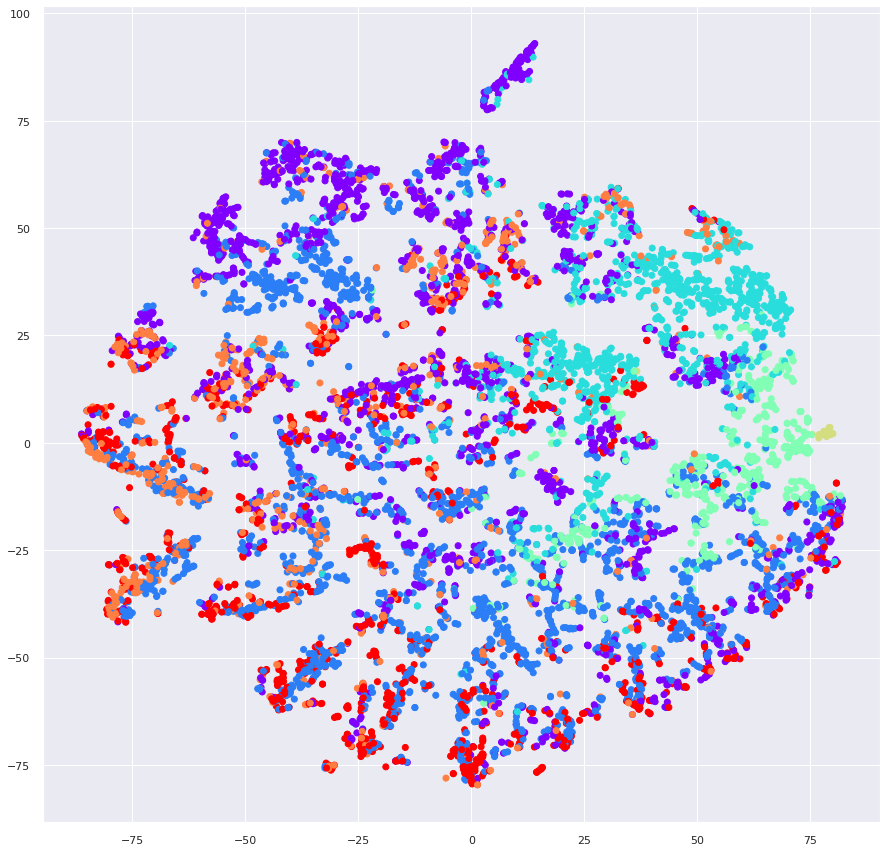

In [23]:
plt.figure(figsize=(15,15))
plt.scatter(tsne_repr[:,0],tsne_repr[:,1],alpha=1,c=cluster_labels,cmap='rainbow')

## 3D plot

In [24]:
fig = px.scatter_3d(data.join(aggro), x='CREDIT_LIMIT', y='PAYMENTS', z='BALANCE', color='classe')
fig.show()

In [25]:
fig = px.scatter_3d(data.join(aggro), x='PURCHASES', y='PAYMENTS', z='BALANCE', color='classe')
fig.show()

### TSNE Representation in 3D

In [26]:
tsne = TSNE(n_components=3,random_state=17)
tsne_repr = tsne.fit_transform(data[num_feats])
d=pd.DataFrame(tsne_repr,columns=["x","y","z"]).join(aggro)

In [27]:
fig = px.scatter_3d(d, x='x', y='y',z="z", color='classe')
fig.show()

# Dendrogram plot

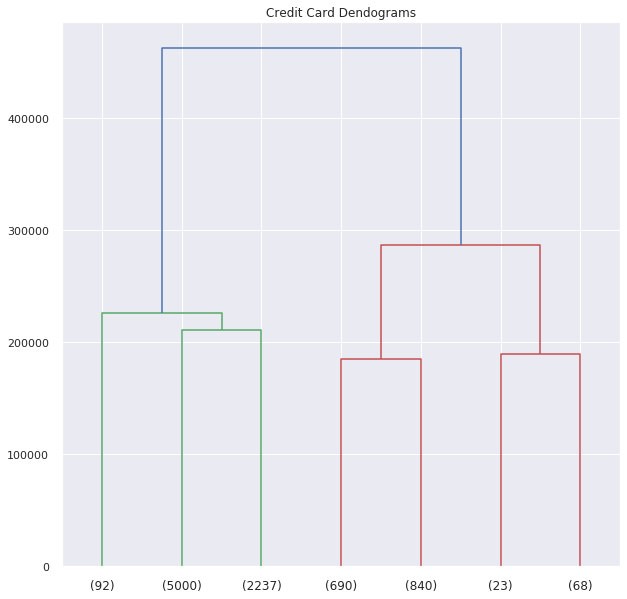

In [28]:
plt.figure(figsize=(10,10))
plt.title("Credit Card Dendograms")
dend=shc.dendrogram(shc.linkage(data[num_feats],method='ward'),truncate_mode='lastp', p=Agglo_n_clust_distortion)

# Use k-means clustering 

### Fitting K (number of clusters) using the Elbow method and the distortion metric

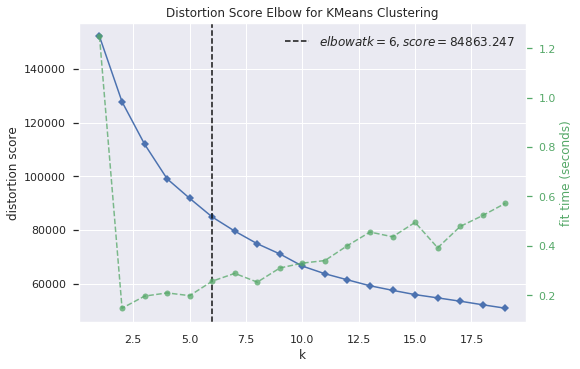

In [29]:
model = KMeans(random_state=17, n_jobs=-1,init='k-means++',algorithm='auto')
visualizer_kmean = KElbowVisualizer(model, k=(1,20),metric='distortion')

visualizer_kmean.fit(data2)        
visualizer_kmean.show()        

In [30]:
kmean_n_clust_distortion=int(visualizer_kmean.elbow_value_)
Kmean_dist=int(visualizer_kmean.elbow_score_)
print(f"Elbow detected at K= {kmean_n_clust_distortion} clusters with distortion {Kmean_dist}")

Elbow detected at K= 6 clusters with distortion 84863


In [31]:
kmeans=KMeans(n_clusters=kmean_n_clust_distortion,random_state=17, n_jobs=-1,algorithm='auto',init='k-means++')
kmeans.fit(data2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=-1, precompute_distances='auto',
       random_state=17, tol=0.0001, verbose=0)

In [32]:
labels=pd.DataFrame(kmeans.labels_,columns=["labels"])
labels

,labels
0,1
1,0
2,4
3,1
4,1
...,...
8945,3
8946,3
8947,3
8948,1


# 6. Plot the clusters. 

## 2D plots

In [33]:
kmean_centroids=pd.DataFrame(kmeans.cluster_centers_,columns=num_feats)
kmean_centroids

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1.593368,0.377394,-0.209532,-0.151527,-0.217143,1.941607,-0.457006,-0.189573,-0.412648,1.889707,1.839167,-0.251677,0.962876,0.765832,0.508459,-0.392110,-0.090441
1,-0.015448,0.372175,-0.344550,-0.223146,-0.404625,-0.084455,-0.823971,-0.334238,-0.769054,0.129528,-0.029565,-0.469897,-0.336172,-0.261873,-0.031893,-0.450657,-0.007776
2,-0.697844,-2.121553,-0.313038,-0.231015,-0.315659,-0.306912,-0.560037,-0.418705,-0.465064,-0.484403,-0.357813,-0.425746,-0.209329,-0.221025,-0.246442,0.261571,-0.165980
3,-0.397180,0.307852,-0.067447,-0.245377,0.291290,-0.366585,0.966328,-0.377527,1.141587,-0.463524,-0.358367,0.122699,-0.329379,-0.251691,-0.057548,0.342254,-0.026033
4,0.135572,0.427001,0.920920,0.871723,0.575959,-0.310454,1.087442,1.838477,0.541302,-0.406320,-0.319876,1.179449,0.686994,0.372808,-0.027865,0.434401,0.271237
5,1.430238,0.419467,6.915048,6.083034,5.172266,0.038778,1.090699,1.879303,1.049413,-0.249227,-0.038166,4.646228,2.198371,4.783704,1.071663,0.824001,0.334613


In [34]:
#data3=pd.DataFrame(data2,columns=num_feats)

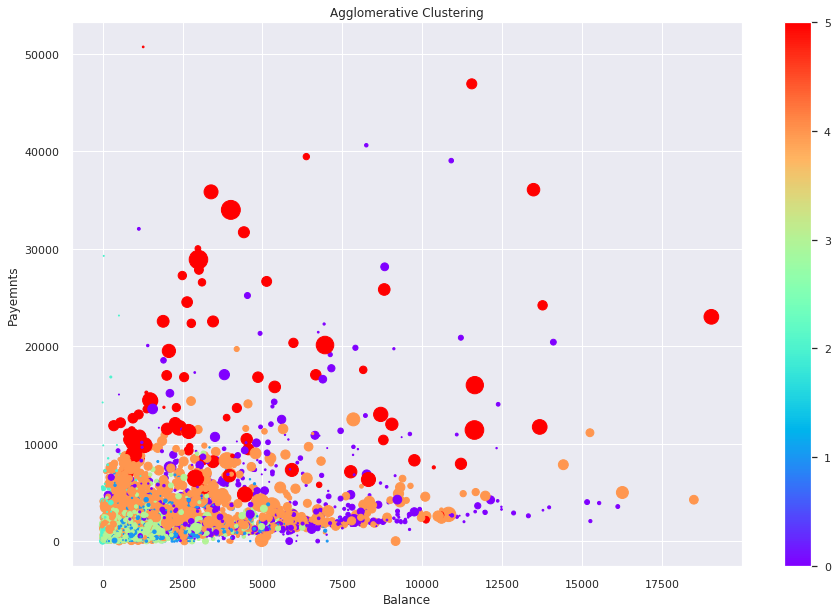

In [35]:
fig= plt.figure(figsize=(15,10))
ax=fig.add_subplot(111)
scatter = ax.scatter(data.BALANCE,data.PAYMENTS,c=kmeans.labels_,cmap='rainbow',alpha=1,s=data.PURCHASES_TRX)
ax.set_title('Agglomerative Clustering')
ax.set_xlabel('Balance')
ax.set_ylabel('Payemnts')
#ax.scatter(kmean_centroids.BALANCE,kmean_centroids.PAYMENTS, color='black',s=200,marker='x')
plt.colorbar(scatter)

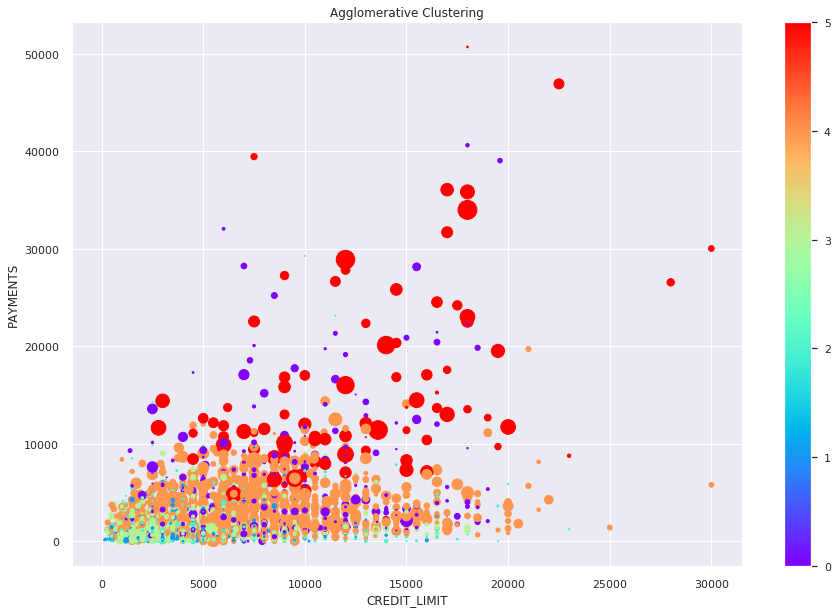

In [36]:
fig= plt.figure(figsize=(15,10))
ax=fig.add_subplot(111)
scatter = ax.scatter(data.CREDIT_LIMIT,data.PAYMENTS,c=kmeans.labels_,cmap='rainbow',alpha=1,s=data.PURCHASES_TRX)
ax.set_title('Agglomerative Clustering')
ax.set_xlabel('CREDIT_LIMIT')
ax.set_ylabel('PAYMENTS')
#ax.scatter(kmean_centroids.CREDIT_LIMIT,kmean_centroids.PAYMENTS, color='black',s=200,marker='x')
plt.colorbar(scatter)

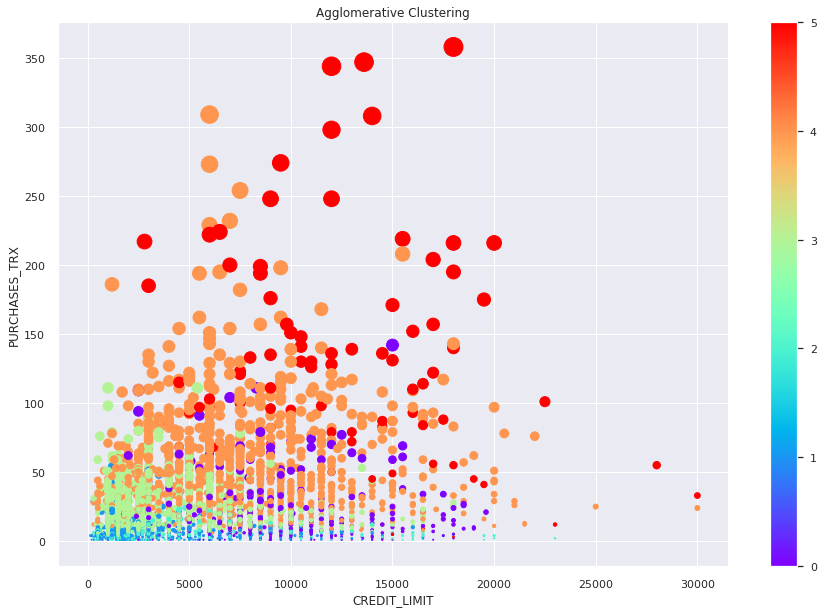

In [37]:
fig= plt.figure(figsize=(15,10))
ax=fig.add_subplot(111)
scatter = ax.scatter(data.CREDIT_LIMIT,data.PURCHASES_TRX,c=kmeans.labels_,cmap='rainbow',alpha=1,s=data.PURCHASES_TRX)
ax.set_title('Agglomerative Clustering')
ax.set_xlabel('CREDIT_LIMIT')
ax.set_ylabel('PURCHASES_TRX')
#ax.scatter(kmean_centroids.CREDIT_LIMIT,kmean_centroids.PURCHASES_TRX, color='black',s=200,marker='x')
plt.colorbar(scatter)

## 3D plot

In [38]:
fig = px.scatter_3d(data.join(labels), x='CREDIT_LIMIT', y='PAYMENTS', z='BALANCE', color='labels')
fig.show()

# 7. Compare the two results. (Bonus: search for another validation metric)

## Silhouette Coefficient

If the ground truth labels are not known, evaluation must be performed using the model itself. The Silhouette Coefficient (sklearn.metrics.silhouette_score) is an example of such an evaluation, where a higher Silhouette Coefficient score relates to a model with better defined clusters.

The score is bounded between -1 for incorrect clustering and +1 for highly dense clustering. Scores around zero indicate overlapping clusters.

## Calinski-Harabasz Index

If the ground truth labels are not known, the Calinski-Harabasz index (sklearn.metrics.calinski_harabasz_score) - also known as the Variance Ratio Criterion - can be used to evaluate the model, where a higher Calinski-Harabasz score relates to a model with better defined clusters.

## Davies-Bouldin Index

If the ground truth labels are not known, the Davies-Bouldin index (sklearn.metrics.davies_bouldin_score) can be used to evaluate the model, where a lower Davies-Bouldin index relates to a model with better separation between the clusters.

In [43]:
Agglo_results={}
Agglo_results["Nb Clusters"]=Agglo_n_clust_distortion
Agglo_results["Distortion"]=Agglo_dist
Agglo_results["Silhouette score"]=metrics.silhouette_score(data[num_feats],aggro.classe)
Agglo_results["Calinski-Harabasz Index"]=metrics.calinski_harabasz_score(data[num_feats],aggro.classe)
Agglo_results["Davies-Bouldin Index"]=metrics.davies_bouldin_score(data[num_feats],aggro.classe)

Kmean_results={}
Kmean_results["Nb Clusters"]=kmean_n_clust_distortion
Kmean_results["Distortion"]=Kmean_dist
Kmean_results["Silhouette score"]=metrics.silhouette_score(data[num_feats],labels.labels)
Kmean_results["Calinski-Harabasz Index"]=metrics.calinski_harabasz_score(data[num_feats],labels.labels)
Kmean_results["Davies-Bouldin Index"]=metrics.davies_bouldin_score(data[num_feats],labels.labels)

evaluation={}
evaluation["Nb Clusters"]='Not applicable'
evaluation["Distortion"]="0< Less better"
evaluation["Silhouette score"]="-1< More better <1"
evaluation["Calinski-Harabasz Index"]="0< More better"
evaluation["Davies-Bouldin Index"]="0< Less better"

results={'Agglomerative':Agglo_results,'Kmeans':Kmean_results, 'Evaluation':evaluation }

pd.DataFrame(results)

,Agglomerative,Kmeans,Evaluation
Nb Clusters,7.000000,6.000000,Not applicable
Distortion,87597.000000,84863.000000,0< Less better
Silhouette score,-0.058368,0.006200,-1< More better <1
Calinski-Harabasz Index,831.996277,977.062123,0< More better
Davies-Bouldin Index,3.200860,3.275686,0< Less better


![](https://media1.giphy.com/media/kBwKMKm1P9sbsYvuvZ/giphy.webp?cid=ecf05e47d3bbf8cffaf04deaee3f2c2f9f94277d59163c6c&rid=giphy.webp)
![](https://i.ytimg.com/vi/4b5d3muPQmA/maxresdefault.jpg)
According to the comparation result Table it seems that Kmeans algorithm does better that Agglomerative Approach 